<a href="https://colab.research.google.com/github/drshahizan/Python_EDA/blob/main/assignment/hpdp/BERUK%20/cs2a.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **AUTOMATED EDA TOOL: SWEETVIZ**

Sweetviz is a wonderful and very useful Python library that provides us with the EDA of a given dataset with just 2 lines of code. It generates an independent HTML page report with interactive visualizations of a dataset. It can save a lot of our time which would have otherwise been spent doing EDA manually. It also saves us from mistakes which we could introduce when doing things by ourselves.

###**1. Installing EDA Tool : SweetViz**

To use sweetviz, simply install the package from pip inside a notebook using shell commands ("!"):

In [2]:
!pip install sweetviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 67.4 MB/s eta 0:00:00


In [3]:
import sweetviz as sv

### **2. Malaysian Dataset : COVID-19 Cases 2020-2023**

In [4]:
import pandas as pd
path = "https://raw.githubusercontent.com/MoH-Malaysia/covid19-public/main/epidemic/cases_state.csv"

In [5]:
df = pd.read_csv(path)

In [6]:
df.head()

,date,state,cases_new,cases_import,cases_recovered,cases_active,cases_cluster,cases_unvax,cases_pvax,cases_fvax,...,cases_0_4,cases_5_11,cases_12_17,cases_18_29,cases_30_39,cases_40_49,cases_50_59,cases_60_69,cases_70_79,cases_80
0,2020-01-25,Johor,4,4,0,4,0,4,0,0,...,0,0,0,0,0,1,0,0,0,0
1,2020-01-25,Kedah,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2020-01-25,Kelantan,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2020-01-25,Melaka,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2020-01-25,Negeri Sembilan,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### **3. Data Prepration & Cleaning**

Assign the number of rows & columns to num_rows & num_columns respectively

In [7]:
num_rows, num_columns = df.shape

Display the number of rows and columns

In [8]:
print(f'Number of rows: {num_rows}, Number of columns: {num_columns}')

Number of rows: 22080, Number of columns: 25


Display data types of each collumn and non-null values

In [10]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22080 entries, 0 to 22079
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   date              22080 non-null  object
 1   state             22080 non-null  object
 2   cases_new         22080 non-null  int64 
 3   cases_import      22080 non-null  int64 
 4   cases_recovered   22080 non-null  int64 
 5   cases_active      22080 non-null  int64 
 6   cases_cluster     22080 non-null  int64 
 7   cases_unvax       22080 non-null  int64 
 8   cases_pvax        22080 non-null  int64 
 9   cases_fvax        22080 non-null  int64 
 10  cases_boost       22080 non-null  int64 
 11  cases_child       22080 non-null  int64 
 12  cases_adolescent  22080 non-null  int64 
 13  cases_adult       22080 non-null  int64 
 14  cases_elderly     22080 non-null  int64 
 15  cases_0_4         22080 non-null  int64 
 16  cases_5_11        22080 non-null  int64 
 17  cases_12_17 

Check if there are any missing values in columns

In [36]:
print(df.isnull().sum())

date                0
state               0
cases_new           0
cases_import        0
cases_recovered     0
cases_active        0
cases_cluster       0
cases_unvax         0
cases_pvax          0
cases_fvax          0
cases_boost         0
cases_child         0
cases_adolescent    0
cases_adult         0
cases_elderly       0
cases_0_4           0
cases_5_11          0
cases_12_17         0
cases_18_29         0
cases_30_39         0
cases_40_49         0
cases_50_59         0
cases_60_69         0
cases_70_79         0
cases_80            0
year                0
month               0
day                 0
weekday             0
dtype: int64


Display each column's basic statistics

In [9]:
print(df.describe())

          cases_new  cases_import  cases_recovered   cases_active  \
count  22080.000000  22080.000000     22080.000000   22080.000000   
mean     232.465172      1.764357       230.256386    2811.504438   
std      660.114558      9.916890       666.957489    7576.321671   
min        0.000000      0.000000         0.000000    -630.000000   
25%        2.000000      0.000000         2.000000      53.000000   
50%       27.000000      0.000000        25.000000     502.000000   
75%      174.000000      0.000000       165.000000    2343.250000   
max    11692.000000    351.000000     12379.000000  103574.000000   

       cases_cluster   cases_unvax    cases_pvax    cases_fvax   cases_boost  \
count   22080.000000  22080.000000  22080.000000  22080.000000  22080.000000   
mean       24.089583     91.600317     19.749094     62.585462     58.530299   
std        72.269705    280.201496    132.745066    207.838534    283.701417   
min         0.000000     -1.000000      0.000000      0.00

From the above description we can see that all the vales are well within range and there are no anomalies, plus there are no null or missing values to address.
Now we would parse date into day, year, month and weekday using DatetimeIndex() function for in depth analysis on these fronts and draw some conclusion based on our findings.

In [35]:
# Convert the 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'])

df['year'] = pd.DatetimeIndex(df.date).year
df['month'] = pd.DatetimeIndex(df.date).month
df['day'] = pd.DatetimeIndex(df.date).day
df['weekday'] = pd.DatetimeIndex(df.date).weekday

df.head()

,date,state,cases_new,cases_import,cases_recovered,cases_active,cases_cluster,cases_unvax,cases_pvax,cases_fvax,...,cases_30_39,cases_40_49,cases_50_59,cases_60_69,cases_70_79,cases_80,year,month,day,weekday
0,2020-01-25,Johor,4,4,0,4,0,4,0,0,...,0,1,0,0,0,0,2020,1,25,5
1,2020-01-25,Kedah,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2020,1,25,5
2,2020-01-25,Kelantan,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2020,1,25,5
3,2020-01-25,Melaka,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2020,1,25,5
4,2020-01-25,Negeri Sembilan,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2020,1,25,5


Next, for our puposes we need to slice the dataset into two specifically so that we can make use of SweetViz's compare() function which requires a 'train' and a 'test' dataset.

In [20]:
train_size = int(0.5 * len(df))
df_train, df_test = df[:train_size], df[train_size:]

For this example, the two datasets are equally sized, they each represent the two halves of time period covering the cases of COVID-19 from January 2020 until July 2023.

In [21]:
print("Training set shape:", df_train.shape)
print("Test set shape:", df_test.shape)

Training set shape: (11040, 25)
Test set shape: (11040, 25)


### **4. Implementation of SweetViz**

Sweetviz provides 3 different methods primarily for performing exploratory data analysis; analyze(), compare() and compare_intra(). We'll focus on analyze() & compare() for this dataset:

***a. analyze()***

Use this version when there is only a single dataset to analyze, and you do not wish to compare subpopulations together.

In [22]:
report = sv.analyze(df)

                                             |          | [  0%]   00:00 -> (? left)

You can show the output inside IDE as notebook using .show_notebook() but you can also choose to show it in another HTML page using .show_html. Both methods can be scaled to fit the preferred ratios.


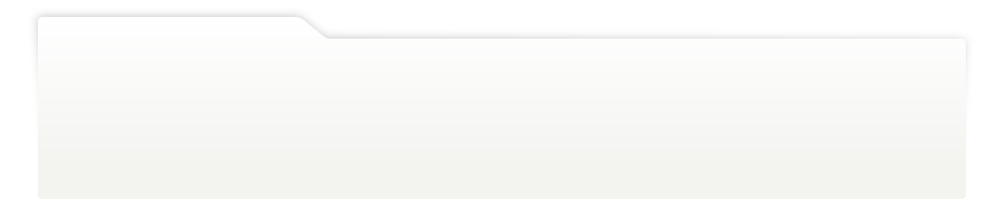
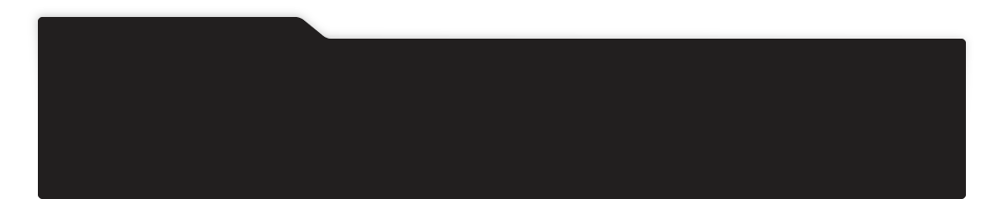
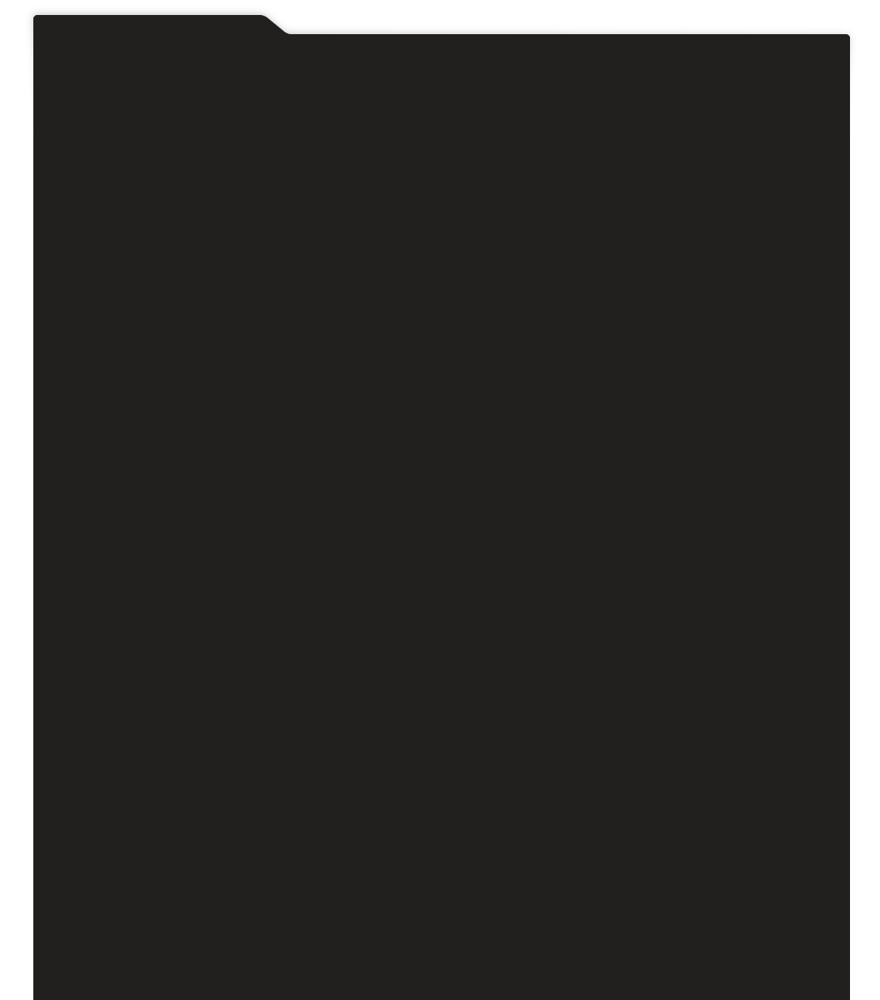
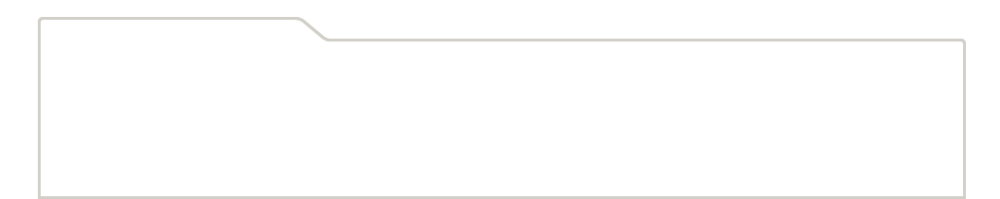
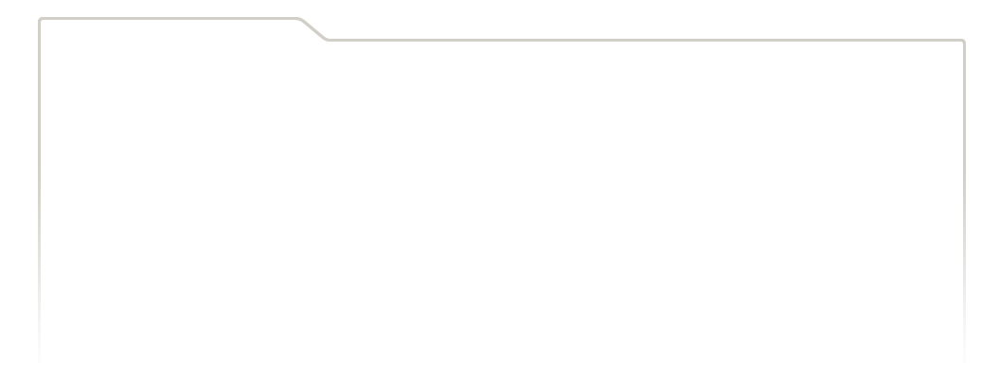
...
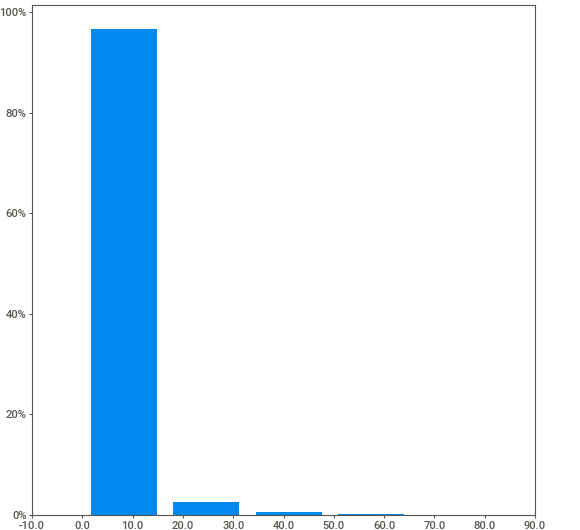
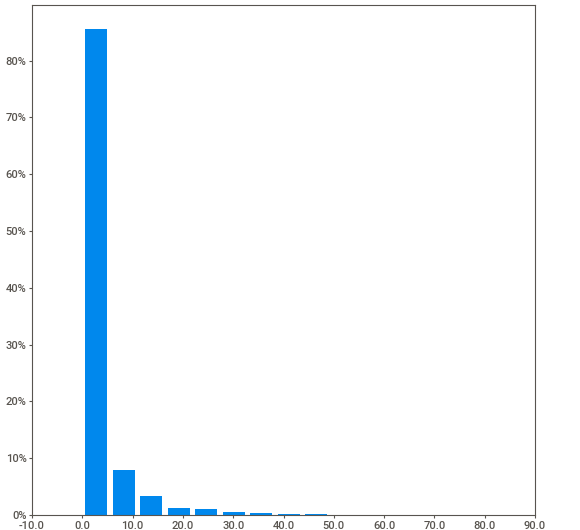
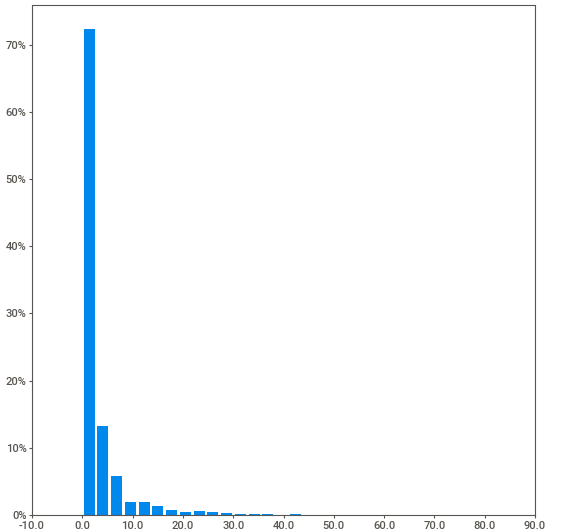
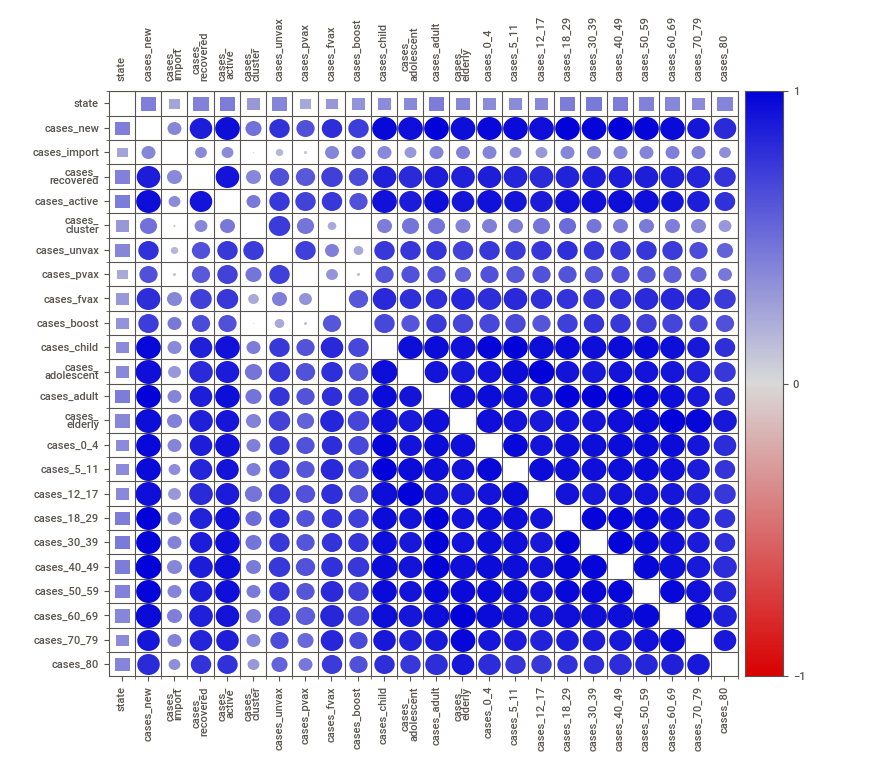
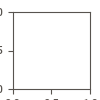

In [23]:
report.show_notebook(layout='vertical', w=800, h=300, scale=0.7)

The **analyze()** function can take multiple other arguments:

***source***: either the data frame (as in the example) or a tuple containing the data frame and a name to show in the report. e.g. df or [df, "Training"]

***target_feat***: a string representing the name of the feature to be marked as "target". Only BOOLEAN and NUMERICAL features can be targets for now.

***feat_cfg***: a sweetviz.FeatureConfig object representing features to be skipped, or to be forced a certain type in the analysis. The arguments can either be a single string or list of strings.

...for example:

In [30]:
feature_config = sv.FeatureConfig(skip=["date", "year", "month", "day", "weekday")
analyze_report = sv.analyze([df,'Training'], 'cases_unvax',  feature_config)

                                             |          | [  0%]   00:00 -> (? left)


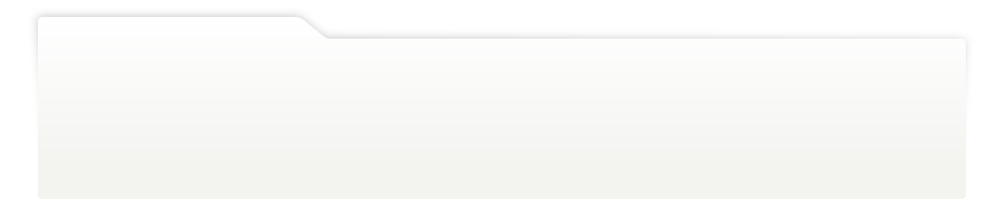
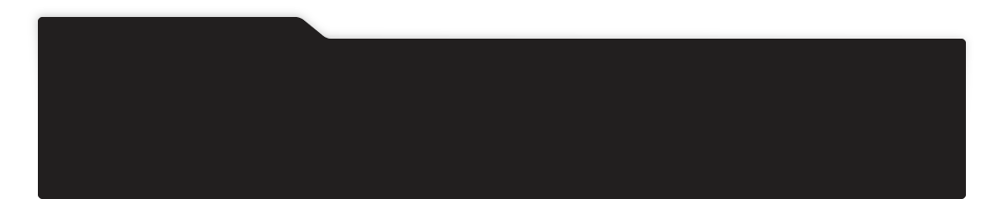
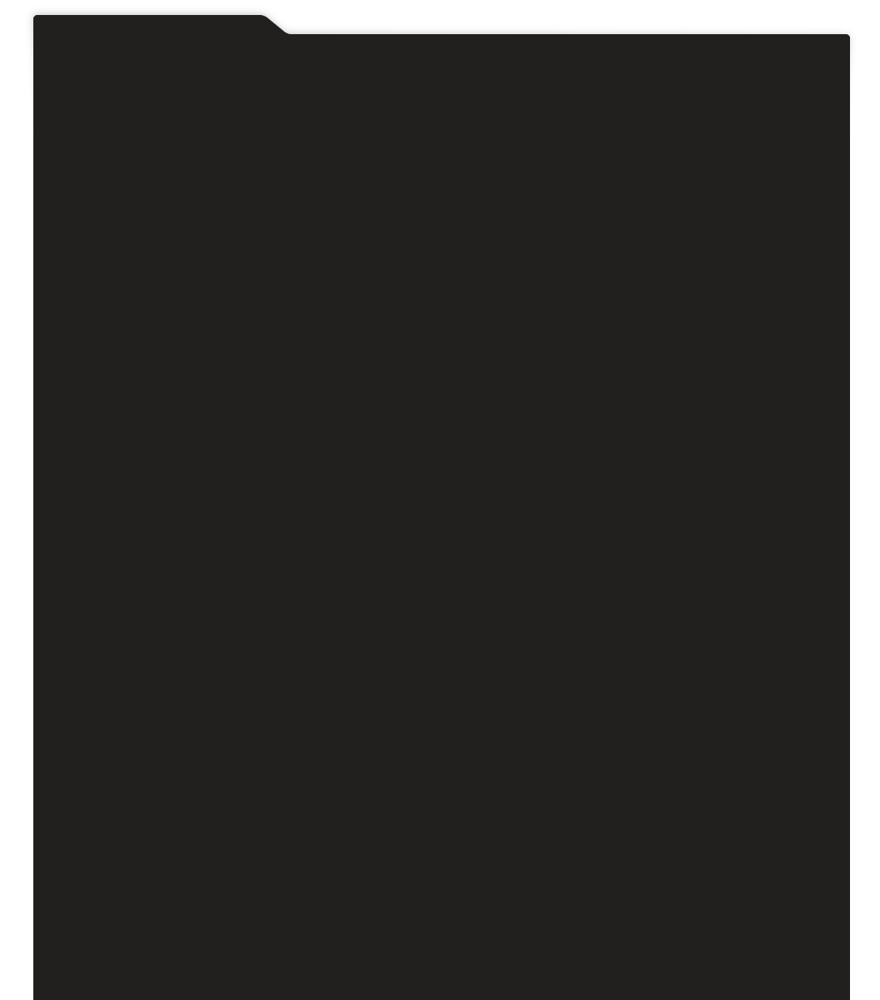
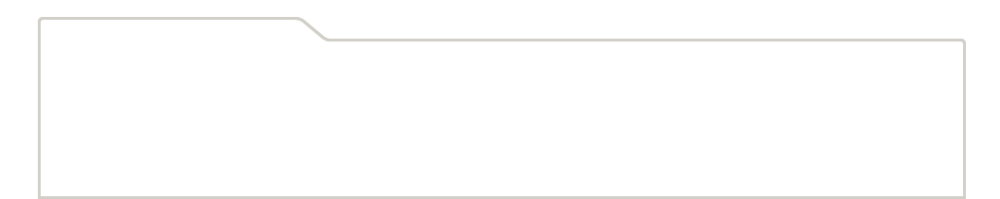
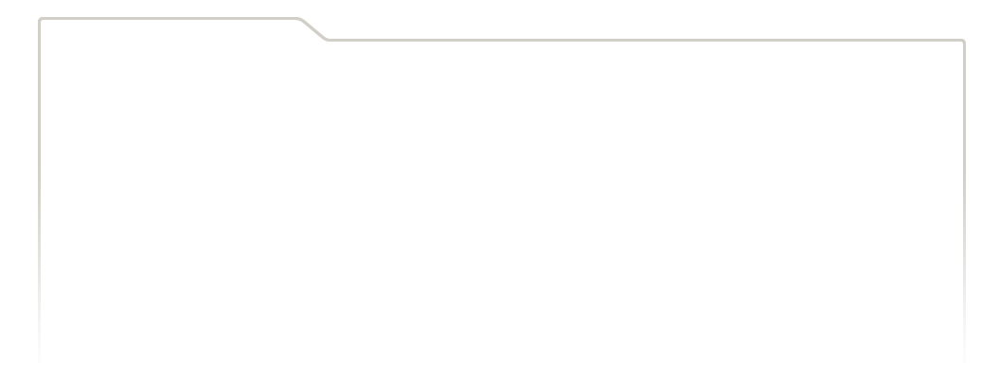
...
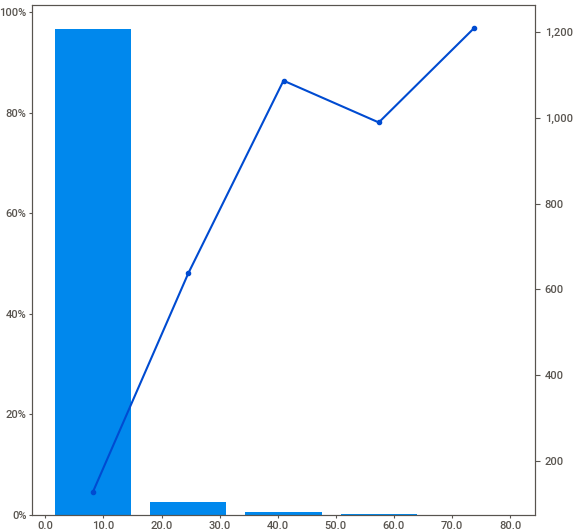
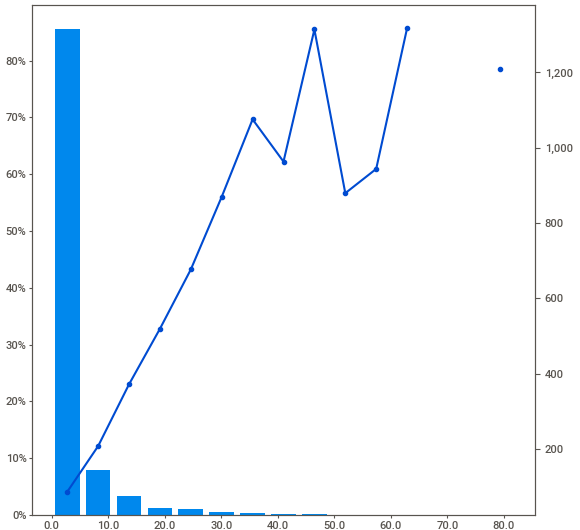
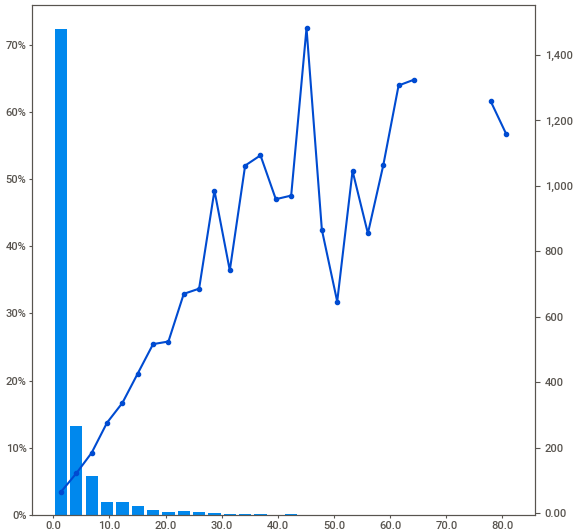
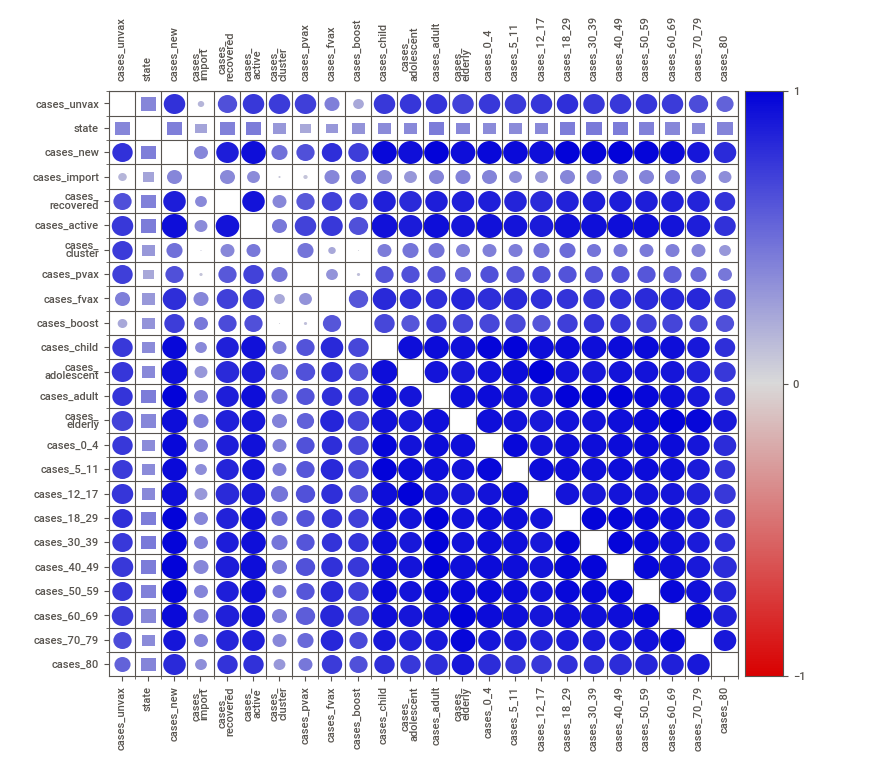
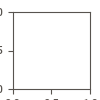

In [31]:
analyze_report.show_notebook()

***b. compare()***

This method takes two dataset as input and let us perform EDA on both at the same time. It shows EDA for each dataset next to each other for better comparison. This method can be useful for performing EDA on a combination of train/test, train/validation, and test/validation datasets.

In [33]:
comparison_report = sv.compare([df_train,'Train'], [df_test,'Test'], target_feat='cases_new')

                                             |          | [  0%]   00:00 -> (? left)


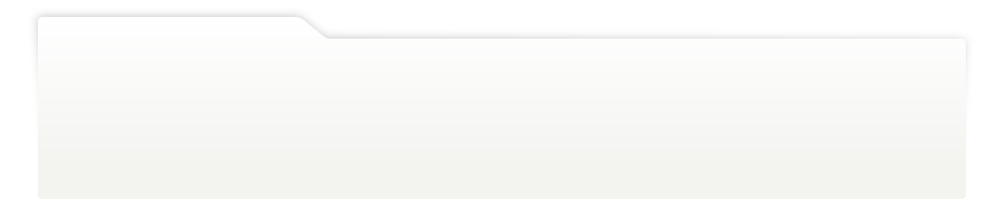
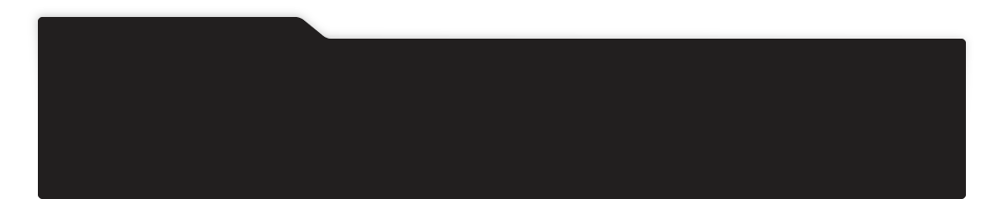
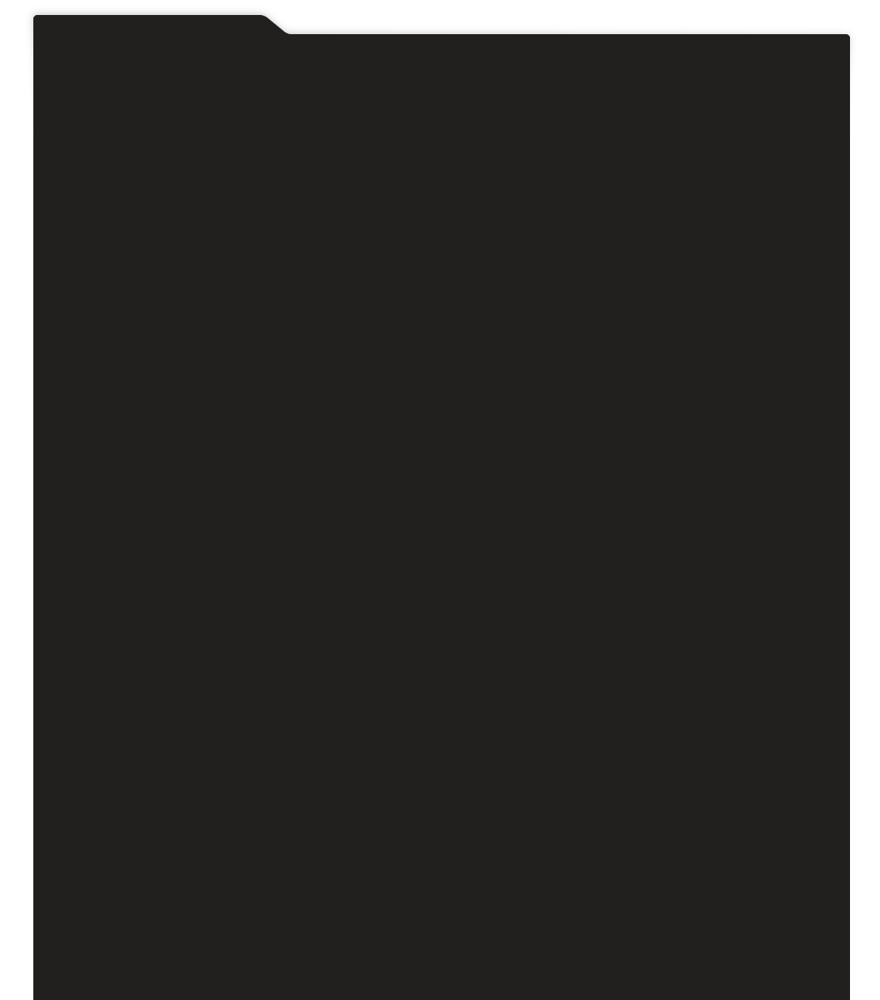
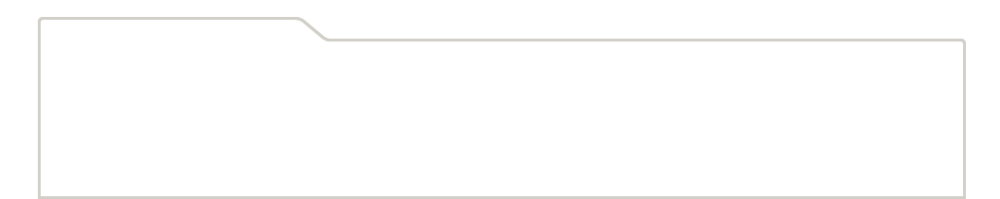
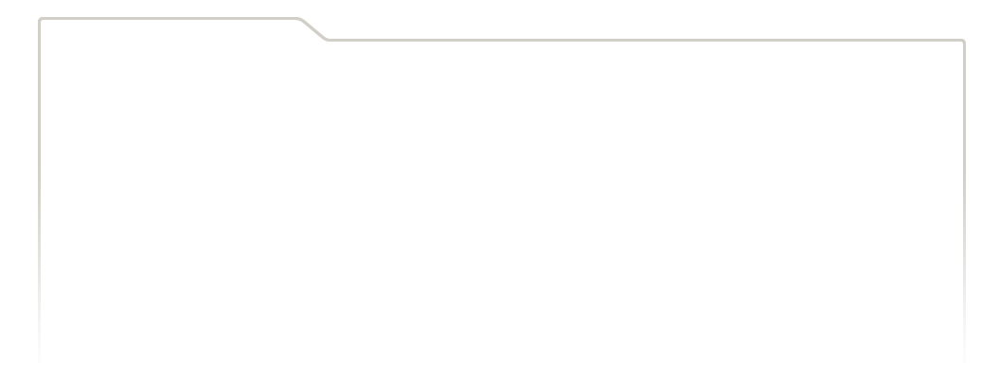
...
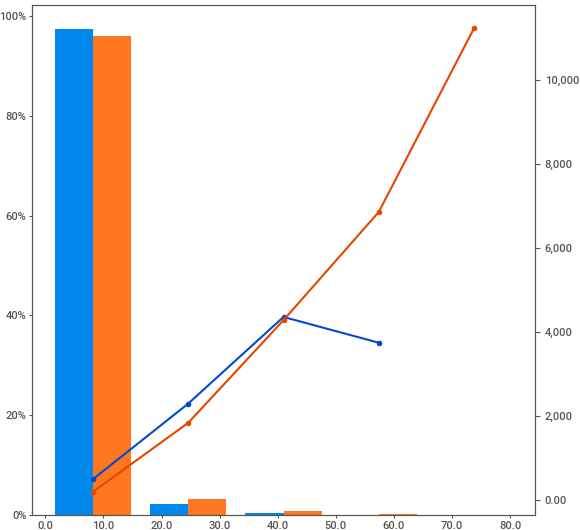
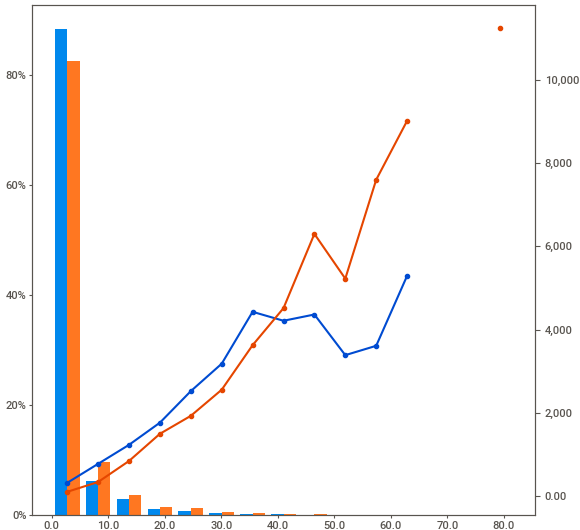
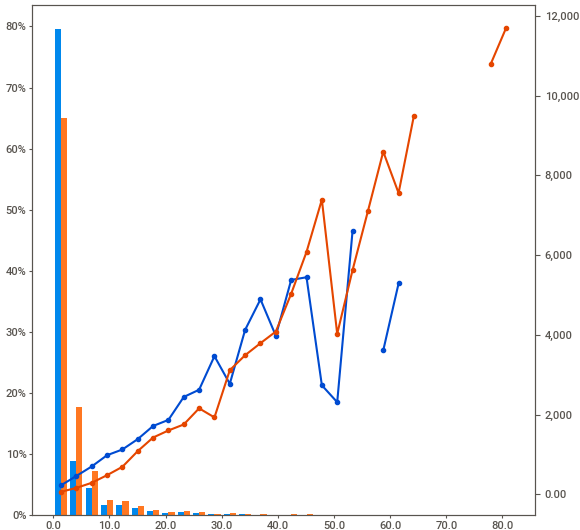
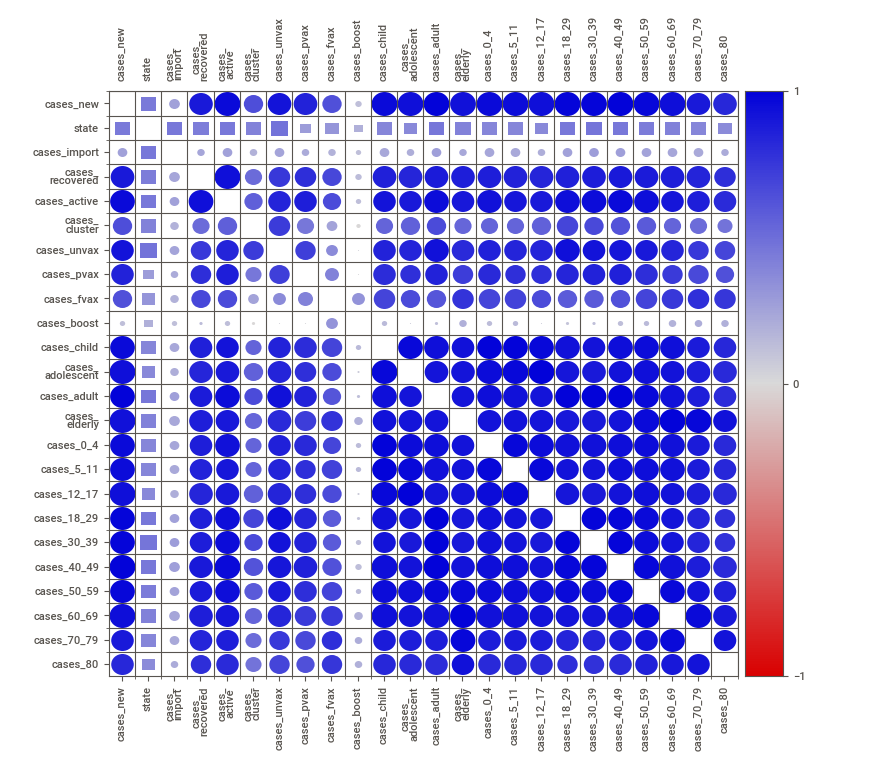
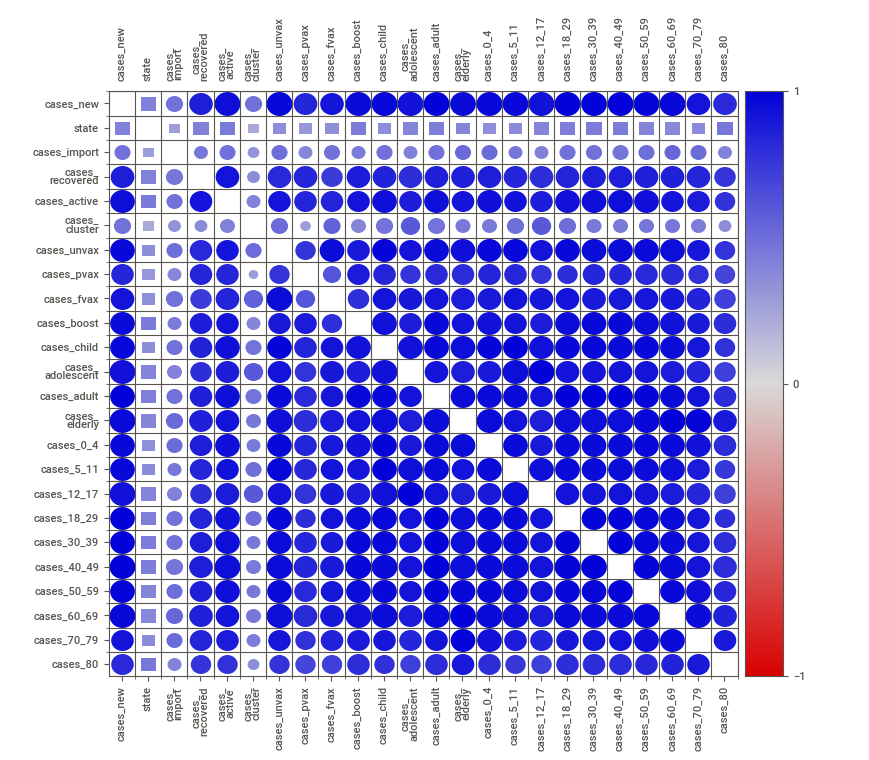

In [25]:
comparison_report.show_notebook()

### **5. Pros & Cons**

**Pros**


1.   *Ease of Use*: SweetViz is designed to be user-friendly and requires minimal code to generate informative reports, making it accessible for users with varying levels of programming expertise.
2.   *Detailed Insights*: The automated reports generated by SweetViz can provide detailed insights into the distribution and relationships within the dataset, helping users identify patterns and anomalies.
3.   *Support for DataFrames*: Sweetviz directly supports Pandas DataFrames, making it convenient for users who are already familiar with Pandas.
4.   *Open Source*: Sweetviz is an open-source library, making it freely available for use and modification.

**Cons**

1.   *Interactivity*: While SweetViz generates interactive HTML reports, the interactivity might be limited compared to tools that offer more dynamic and tailored exploration of visualizations.
2.   *Information Overload*: For complex datasets, the automated reports can include a large number of visualizations, potentially leading to information overload, including irrelevant ones.

### **6. Conclusion**

SweetViz makes it easier for anyone to understand the patterns and connections in a dataset quickly. It's user-friendly and great for exploring data when you're just getting started, kind of like Canva for data analytics. While it's a fantastic starting point for EDA, it's good to know that it might not cover everything. For a deeper understanding of your dataset, especially where SweetViz is currently limited at handling, utilising other tools and methods alongside SweetViz will allow for more information gathering.

### **7. Reference List**

https://colab.research.google.com/drive/1-md6YEwcVGWVnQWTBirQSYQYgdNoeSWg?usp=sharing#scrollTo=Bzh32U31oqn-

https://coderzcolumn.com/tutorials/data-science/sweetviz-automate-exploratory-data-analysis-eda

https://pypi.org/project/sweetviz/
